In [43]:
### importing necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium

from scipy import stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.model_selection import train_test_split

### import data and convert data column entries to datatime object
df_house_complete =  pd.read_csv('kc_house_prices/King_County_House_prices_dataset.csv')
df_house_complete.date = pd.to_datetime(df_house_complete.date)
df_house_complete.sort_values('date',inplace=True)

# create some new features, age is easier to interpret as yr_built
df_house_complete.eval('price_per_sqft = price / sqft_living',inplace=True)
df_house_complete['month'] = df_house_complete['date'].dt.month
df_house_complete['year'] = df_house_complete['date'].dt.year
df_house_complete['age'] = 2015 - df_house_complete['yr_built']
df_house_complete.drop('yr_built',axis=1)

df_house_complete.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21597 entries, 7316 to 16580
Data columns (total 25 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   id              21597 non-null  int64         
 1   date            21597 non-null  datetime64[ns]
 2   price           21597 non-null  float64       
 3   bedrooms        21597 non-null  int64         
 4   bathrooms       21597 non-null  float64       
 5   sqft_living     21597 non-null  int64         
 6   sqft_lot        21597 non-null  int64         
 7   floors          21597 non-null  float64       
 8   waterfront      19221 non-null  float64       
 9   view            21534 non-null  float64       
 10  condition       21597 non-null  int64         
 11  grade           21597 non-null  int64         
 12  sqft_above      21597 non-null  int64         
 13  sqft_basement   21597 non-null  object        
 14  yr_built        21597 non-null  int64         
 15 

In [45]:
### fill some missing values where we can assume that no views, waterfront or renovation is present
df_house_complete['sqft_basement'] = df_house_complete['sqft_basement'].replace('?','0').astype('float32')
df_house_complete['yr_renovated'].fillna(0,inplace=True)
df_house_complete['view'].fillna(0,inplace=True)
df_house_complete['waterfront'].fillna(0,inplace=True)

In [31]:
print('Total number of houses in Dataset:  ' + str(df_house_complete.shape[0]))
print('Number of Houses sold for a price greater than 4M$:  ' +str(df_house_complete.query('price > 4000000').shape[0]))

Total number of houses in Dataset:  21597
Number of Houses sold for a price greater than 4M$:  11


# Note 1
The number of very expensive houses (>4M$) constitutes only a small amount of the total number of houses. For these estates it is likely, that other criterias apply than for the "normally priced" houses.
For prediction lets focus first on the normally priced ones.

In [32]:
df_low_price = df_house_complete.query('price < 4000000')
df_high_price = df_house_complete.query('price > 4000000')

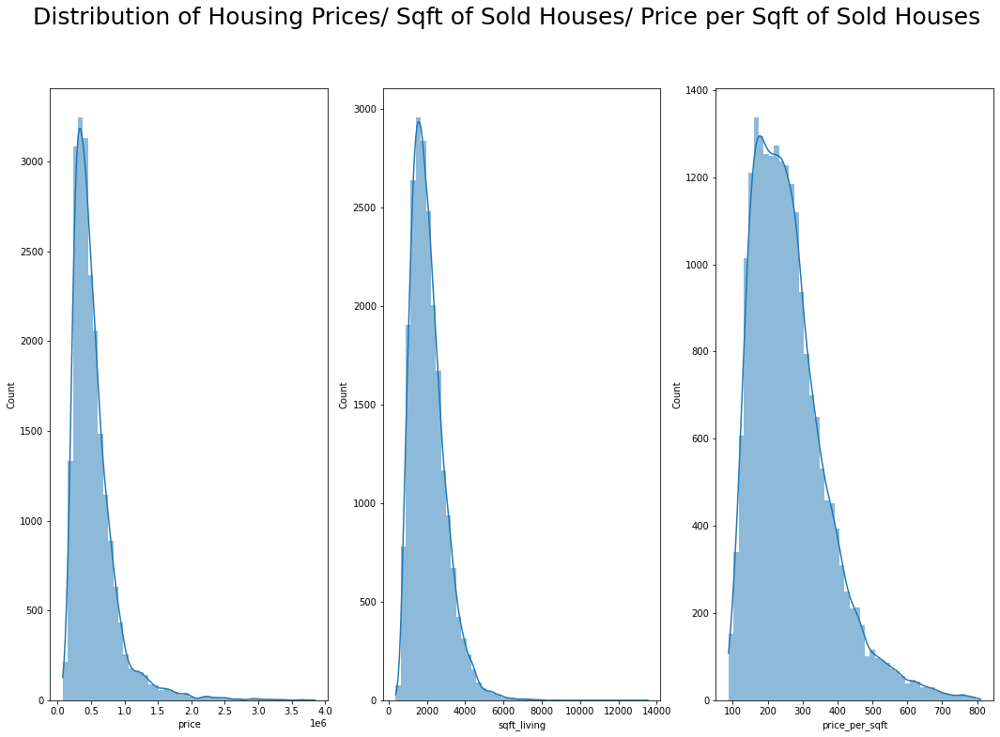

In [33]:
fig, axs = plt.subplots(1, 3, figsize = (18, 12))
sns.histplot(df_low_price['price'], bins=50, lw= 0, kde = True, ax=axs[0]);
sns.histplot(df_low_price['sqft_living'], bins=50, lw= 0, kde = True, ax=axs[1]);
sns.histplot(df_low_price['price_per_sqft'], bins=50, lw= 0, kde = True, ax=axs[2]);
fig.suptitle('Distribution of Housing Prices/ Sqft of Sold Houses/ Price per Sqft of Sold Houses', size='25');

# Note 2
* 'sqft_living' is of course the largesr contributor to 'price' no need for analysis here....
* Price is right skewed but resembles more of a normal distribution than 'price_per_sqft' therefore it is better suited for a linear regression
* Right skewedness originates mostly from 'price_per_sqft' (ppsqft)
* but ppsqft might be better suitable to explain relationship between price and other variables, i.e. older houeses sell for more, but this might be due to larger 'sqft_living' of older houeses in general

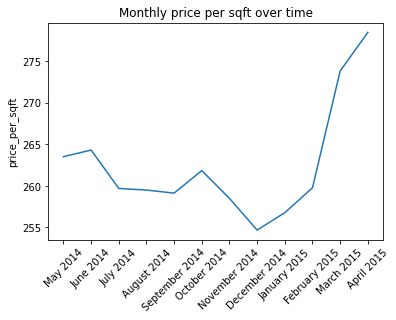

In [34]:
monthly_price_sqft = df_low_price.query('(year == 2014 and month in [5,6,7,8,9,10,11,12]) or (year == 2015 and month in [1,2,3,4])').groupby(['year','month']).mean()['price_per_sqft'].reset_index()
fig = sns.lineplot(x=monthly_price_sqft.index,y=monthly_price_sqft['price_per_sqft'])
fig.set_xticks(range(len(monthly_price_sqft)))
fig.set_xticklabels(['May 2014','June 2014','July 2014','August 2014','September 2014','October 2014','November 2014','December 2014','January 2015','February 2015','March 2015','April 2015'], rotation = 45);
fig.set_title('Monthly price per sqft over time');

# Note 3
* Around New Year less houses are traded in the market
* Maybe there is a current trend for higher prices
* It is possible to include the date in a linear regression, howerver: it made no difference in the R^2 or the RMSE

In [35]:
### what are the values that have the highest correlation with 'price_per_sqft'
### generate feature for price_per_sqft of the neighboorhood
price_mean = df_low_price.groupby('zipcode').mean()['price_per_sqft']
df_low_price['zipcode_mean_ppsqft'] = df_low_price['zipcode']
df_low_price.zipcode_mean_ppsqft.replace(price_mean, inplace=True)

corr_values = ['price_per_sqft','sqft_living','sqft_lot','bedrooms','bathrooms','condition','grade','view','age','sqft_living15','sqft_lot15','zipcode_mean_ppsqft']
df_low_price[corr_values].corr()

<ipython-input-35-00c6cf29a46b>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_low_price['zipcode_mean_ppsqft'] = df_low_price['zipcode']
/Users/adrian/neuefische/EDA-project_KC_Housing_Prices/.venv/lib/python3.8/site-packages/pandas/core/series.py:4479: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().replace(


,price_per_sqft,sqft_living,sqft_lot,bedrooms,bathrooms,condition,grade,view,age,sqft_living15,sqft_lot15,zipcode_mean_ppsqft
price_per_sqft,1.000000,-0.106182,-0.035533,-0.210391,-0.100095,0.104229,0.118836,0.217784,0.292148,0.033948,-0.059928,0.743866
sqft_living,-0.106182,1.000000,0.174713,0.579670,0.752457,-0.059050,0.761872,0.276375,-0.321521,0.758393,0.185809,0.082483
sqft_lot,-0.035533,0.174713,1.000000,0.032157,0.088173,-0.008754,0.114513,0.074778,-0.052875,0.144613,0.718197,-0.110618
bedrooms,-0.210391,0.579670,0.032157,1.000000,0.513327,0.026771,0.354401,0.075878,-0.155479,0.391765,0.030351,-0.009029
bathrooms,-0.100095,0.752457,0.088173,0.513327,1.000000,-0.126634,0.662864,0.180705,-0.509784,0.567849,0.088048,0.061804
condition,0.104229,-0.059050,-0.008754,0.026771,-0.126634,1.000000,-0.146770,0.046390,0.361475,-0.092785,-0.003035,0.072064
grade,0.118836,0.761872,0.114513,0.354401,0.662864,-0.146770,1.000000,0.245692,-0.448706,0.712602,0.120795,0.187316
view,0.217784,0.276375,0.074778,0.075878,0.180705,0.046390,0.245692,1.000000,0.055214,0.276889,0.072804,0.100688
age,0.292148,-0.321521,-0.052875,-0.155479,-0.509784,0.361475,-0.448706,0.055214,1.000000,-0.326395,-0.070647,0.280863
sqft_living15,0.033948,0.758393,0.144613,0.391765,0.567849,-0.092785,0.712602,0.276889,-0.326395,1.000000,0.183402,0.057941


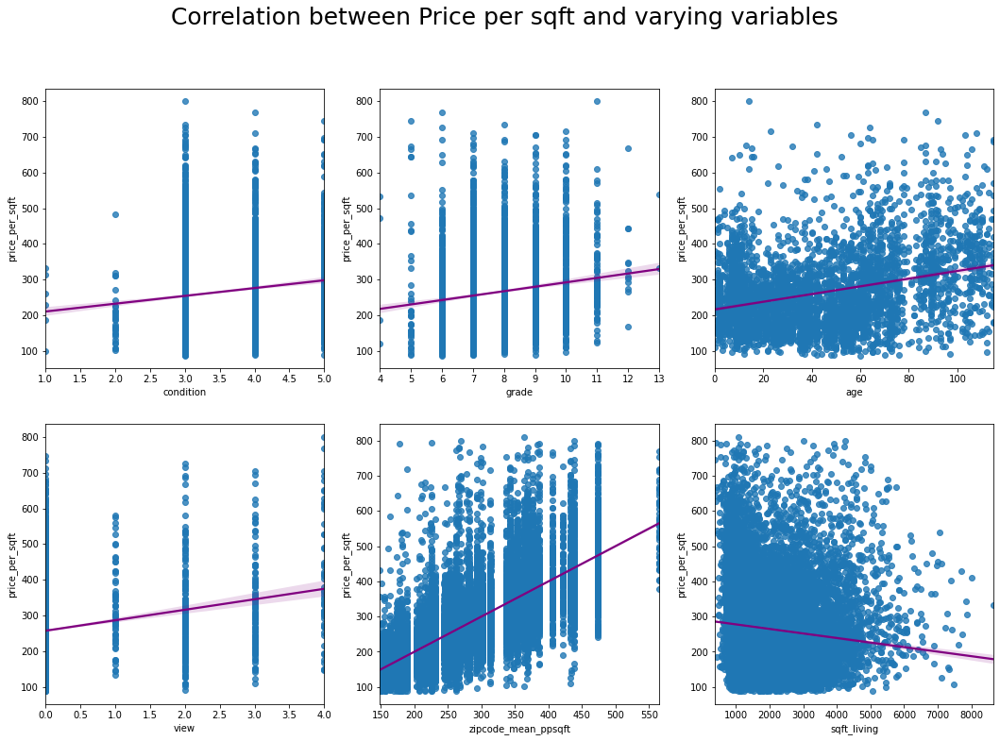

In [49]:
fig, axs = plt.subplots(2, 3, figsize = (18, 12))
fig.suptitle('Correlation between Price per sqft and predictor variables', size='25')
sns.regplot(x='condition',y='price_per_sqft', data=df_low_price[corr_values][0:4000], line_kws={"color": "purple"}, ax=axs[0,0])
sns.regplot(x='grade',y='price_per_sqft', data=df_low_price[corr_values][0:4000], line_kws={"color": "purple"}, ax=axs[0,1])
sns.regplot(x='age',y='price_per_sqft', data=df_low_price[corr_values][0:4000], line_kws={"color": "purple"}, ax=axs[0,2])
sns.regplot(x='view',y='price_per_sqft', data=df_low_price[corr_values][0:4000], line_kws={"color": "purple"}, ax=axs[1,0])
sns.regplot(x='zipcode_mean_ppsqft',y='price_per_sqft',  data=df_low_price[corr_values],  line_kws={"color": "purple"}, ax=axs[1,1]);
sns.regplot(x='sqft_living',y='price_per_sqft', data=df_low_price.query('sqft_living < 12000')[corr_values], line_kws={"color": "purple"}, ax=axs[1,2]);

# Conclusion:
* very high correlation between 'neighboor ppsqft' and 'ppsqft' of the single estate. Single estate is included in the calculation of the mean therefore this is not completely unbiased. But with roughly 300 estates per zip code, this should be fine. Possibly causation here: higher priced neighboors -> higher price of single estate (i.e. this is a nice/bad neighboorhood)
* 'grade', condition, age have a positive correlation. possible causation here
* number of views has a possible correlation, interpretation is more tough though
* sqft_living, sqft_lot have negative correlation. causation is ver likely here: bigger houses -> lower price_per_sqft if everything else is kept the same
* bedrooms and bathrooms are correlated/causated with sqft_living. This leads to correlation with price_per_sqft

# Effect of different Zipcodes on price per sqft

In [36]:
import json

data_geo = df_house_complete.groupby('zipcode')[['price_per_sqft']].mean().reset_index()
data_geo['zipcode'] = data_geo['zipcode'].astype(str)

king_county_geo = 'zipcode_king_county.geojson'

with open(king_county_geo, 'r') as j:
    geo_data = json.load(j)

geozips = []
for i in range(len(geo_data['features'])):
    if geo_data['features'][i]['properties']['ZIPCODE'] in list(data_geo['zipcode'].unique()):
        geozips.append(geo_data['features'][i])

new_json = dict.fromkeys(['type','features'])
new_json['type'] = 'FeatureCollection'
new_json['features'] = geozips

with open('new_geodata.json', 'w') as new_file:
    new_file.write(json.dumps(new_json, sort_keys=True, indent=4, separators=(',',':')))


king_county = 'new_geodata.json'

fig = folium.Figure(width=1000, height=500)
map = folium.Map(location=[47.36, -121.89], zoom_start=10, detect_retina = True, control_scale=False).add_to(fig)

folium.Choropleth(geo_data=king_county, name='choropleth', data=data_geo, columns=['zipcode','price_per_sqft'], key_on='feature.properties.ZIPCODE', fill_color='YlGnBu', fill_opacity=0.6, line_opacity=0.2, legend_name='Price per sqft').add_to(map)

fig

In [ ]:
df_increase_ppsqft = pd.DataFrame(columns=['zipcode','increase_ppsqft'])
for i in df_house_complete['zipcode'].unique(): 
    #query_data = df_low_price.query('(year == 2014 and month in [5,6,7,8,9,10,11,12]) or (year == 2015 and month in [1,2,3,4])').groupby(['year','month','zipcode']).mean()['price_per_sqft'].reset_index().query('zipcode ==' + str(i))
    query_data = df_low_price.query('((year == 2014 and month in [5,6,7,8,9,10,11,12]) or (year == 2015 and month in [1,2,3,4])) and (zipcode ==' + str(i)+')').groupby(['year','month']).mean()[['price_per_sqft','zipcode']].reset_index().query('zipcode ==' + str(i))
    X = query_data.index
    X = sm.add_constant(X)
    y = query_data['price_per_sqft']
    model = sm.OLS(y,X).fit()
    df_increase_ppsqft = df_increase_ppsqft.append({'zipcode':str(i),'increase_ppsqft':model.params[1]/model.params[0] * 100}, ignore_index=True)

data_geo = df_increase_ppsqft

king_county = 'new_geodata.json'

fig = folium.Figure(width=1000, height=500)
map = folium.Map(location=[47.36, -121.89], zoom_start=10, detect_retina = True, control_scale=False).add_to(fig)

folium.Choropleth(geo_data=king_county, name='choropleth', data=data_geo, columns=['zipcode','increase_ppsqft'], key_on='feature.properties.ZIPCODE', fill_color='YlOrRd', fill_opacity=0.6, line_opacity=0.2, legend_name='Average Monthly Percentage Increase Price per sqft', bins=[-2,-1,0,0.5,1,1.5,2,2.5,3]).add_to(map)

fig

# Training multiple linear regression

Model training happens in 'multiple_lin_regr.py' check the results there. Here we present the results from playing with input parameters for the OLS.

## Modelling Conclusions
* all columns(except coordinates) of the dataset are relevant/useable for the OLS and including them yields better results than not 
* Using the mean of price_per_sqft across zipcodes as a single variable yields worse results than categorical zipcodes
* The dependence between age of the house and price is not linear. Therefore we used a categorical approach i.e.


## Result Conclusion
* RMSE of roughly 150K$ is probably an 'okay' result
* The RMSE is influenced by the reduction of housing prices for very expensive estates (<4M$ in our case)
* Further reducing this boundary (maybe to 2M$) will decrease the RMSE substantially. It is not clear whether prediction is worse for very expensive houses (likely, because the relationship between 'price' and 
        'sqft_living' is not linear) or the error is simply worse due to scaling with larger prices.